# Introduction

Paddy, one of the staple crops, is grown almost throughout Asia, especially among small and middle-income countries like Nepal. For many communities, paddy farming is not only a source of livelihood but an activity that connects food security and even cultural heritage. However, paddy farming is prone to all kinds of diseases and pests which can seriously affect the yield of crops. Traditional farmers have to visually inspect and point out any diseases, based on their experience. This is usually time-consuming and open to a lot of human error. Thus, a great need exists for an automated, precision diagnostic system to assist the farmers in the early detection of diseases of paddy varieties in order to minimize crop loss and reduce wasteful application of pesticides.

<img src="https://gpjs3bucket.s3.amazonaws.com/wp-content/uploads/2024/09/30110518/01_GPJNews_Nepal_AJ_EnvironmentallyFarming_057_web.jpg" width="50%" style="display: block; margin-left: auto; margin-right: auto;" />

*Image Source: [Global Press Journal](https://globalpressjournal.com/asia/nepal/water-saving-wonder-transforming-nepals-paddy-fields/)*

# Problem Definition
In Nepal, like in most developing countries, the majority of farmers are constrained by the limited access to improved agricultural tools and technologies, hence making optimum yield hard to achieve. Paddy diseases usually go unnoticed while still at minor stages; thus, irreversible damage occurs before farmers realize the presence of a disease. Manual methods increase the response time, besides upping the chances of misidentifying a disease and using improper pesticides. The disease identification system using automation will help small-scale farmers in disease management by reducing yield loss and hence further providing a sustainable farming environment in resource-poor regions.

<img src="https://kisanvedika.bighaat.com/wp-content/uploads/2023/02/Paddy_sheath-rot-min.png" height="20%" width="20%" style="display: block; margin-left: auto; margin-right: auto;" />

*Image Source: [Kisan Vedika](https://kisanvedika.bighaat.com/wp-content/uploads/2023/02/Paddy_sheath-rot-min.png)*

# Dataset Description
## Paddy Doctor Dataset
The Paddy Doctor dataset is a diverse, well-processed dataset intended to contribute to the progress of automatic diagnosis for paddy diseases. It contains 16,225 high-resolution images, with 1,080 x 1,440 pixels in each, of paddy leaves belonging to 13 different classes, that is, 12 kinds of diseases and one class representing healthy leaves. This is the largest such dataset, expert-annotated, which will serve as an invaluable benchmark for the development and performance evaluation of computer vision algorithms targeting paddy disease detection.

## How were the images collected and annotated?
Images in this dataset were acquired from natural paddy fields located in a rural area near Tirunelveli, Tamil Nadu, India, during the period between February and April 2021, when the crops were within the critical 40 to 80-day growth stage. First, a total of about 30,000 images were captured in JPEG format by using a high-end CAT S62 Pro smartphone. After refining the dataset, removing the duplicate and low-quality samples from it, resulted in a total of 16,225 high-resolution images.
Each image was validated and labeled with the help of an agronomist-a specialist in soil management and field-crop production-to ensure that each label correctly represented the symptoms of the disease affecting the leaf. The metadata, such as the variety and age of the crop involved, were also gathered for each image. Now, this expert-annotated dataset is made available to the research community for the development of sophisticated algorithms in paddy disease detection, thus contributing to more efficient and sustainable agricultural practices.

For more information beyond the scope of this notebook, we can visit the Paddy Doctor project website https://paddydoc.github.io for more information.

![image.png](attachment:69f594bf-274b-4f8e-a4c8-c21b4d601f0c.png)

# Objective
- The objective of this project is to develop a deep learning model using PyTorch that can accurately classify paddy leaf images into one of the 13 classes present in the Paddy Doctor dataset, including 12 disease types and healthy leaves.

# Performance Metrics¶
The following metrics will be used to evaluate the model:

- **Balanced Accuracy** : To factor in class imbalance
- Accuracy
- Precision
- Recall
- F1-Score: To handle class imbalance and assess performance per class.
- ROC-AUC: For a more nuanced view of the model’s discriminatory ability

# Challenges
1. **Class Imbalance**  
2. **Model Overfitting**  
3. **Limited GPU Time**

# Advantages of Applying ML to Paddy Disease Diagnosis
It is important that we be sure that applying ML is actually the best approach to the problem. We donot want to spend computation and time on a problem that can be better solved by a Non-ML approach. We identified the following advantages of applying ML to our problem of Paddy Disease Diagnosis :
1. **Time Effectiveness:** The process of visually examining paddy plant leaves for any disease is labor demanding, time-consuming and requires skilled personnel. A machine learning model can provide a faster diagnosis of a user uploaded leaf image in a matter of seconds. Thanks to this quick analysis, farmers can take corrective measures before such diseases sweep across their farms leading to better management of crops and decreasing possible losses in yield.

2. **Improved Performance:** Any machine learning based algorithm can be taught to classify and recognize a variety of diseases found in paddy rice to high precision by being trained on large volumes of labeled images for simple recognition. Having learned these models, they can differentiate even the most minute peculiarities in the signs and symptoms that human inspectors may disregard ensuring that there is little chance of farmers being able to report false crop disease status thereby providing them with accurate information on the state of their crops.

3. **Economic Benefits:** The introduction of machine learning for paddy disease detection systems incurses noticeable savings. Farmers are able to identify diseases beforehand which means that less pesticides and fertilizers are needed helping the farmer save money as well as practicing eco-friendly agriculture. Also, such a system reduces the dependency on specialists to perform background checks by automating most of the tasks, thereby reducing costs.

# Resources
## Libraries :
- PyTorch
- Tqdm
- Pillow
- os module
- sklearn


## GPU and dataset :
- Kaggle's free access to NVIDIA TESLA P100 GPUs for training and testing.
- Publicly available Paddy Doctor Dataset

# Plan of Action
1. [**Data Loading and Exploration**](#1.-Data-Loading-and-Exploration)
2. [**Data Preprocessing**](#2.-PreProcessing)
3. [**Model Architecture**](#3.-Model-Architecture)
4. [**Training**](#4.-Model-Training)
5. [**Evaluation**](#5.-Evaluation)
6. [**Results Analysis**](#6.-Result-Analysis)
7. [**Conclusion**](#7.-Conclusion)
8. [**Recommendations for Future Improvements**](#8.-Recommendations-for-Future-Improvements)

# 1. Data Loading and Exploration

## 1.a Imports, Installations and Downloads

In [ ]:
import os
import pandas as pd
from PIL import Image
import torchvision.transforms as transforms
import numpy as np
import random
from torch.utils.data import Dataset, DataLoader, random_split
import torch
import cv2
import matplotlib.pyplot as plt
import torchvision.transforms as transforms
from sklearn.preprocessing import LabelEncoder

In [ ]:
# Check if GPU is available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [ ]:
device

device(type='cuda')

### Setting up Wandb for tracking metrics

In [ ]:
import wandb
wandb.login(key="")

wandb: Using wandb-core as the SDK backend. Please refer to https://wandb.me/wandb-core for more information.
wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit:

  ········


wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


True

In [ ]:
wandb.init(
    project="padddy_disease"
)

### Setting seed for reproducibility

In [ ]:
def set_seed(seed: int):
    """Set manual seed for reproducibility."""
    random.seed(seed)                  # Python random generator
    np.random.seed(seed)               # NumPy random generator
    torch.manual_seed(seed)            # CPU
    torch.cuda.manual_seed(seed)       # GPU
    torch.cuda.manual_seed_all(seed)   # All GPUs
    torch.backends.cudnn.deterministic = True  # Ensure deterministic behavior
    torch.backends.cudnn.benchmark = False      # Disable benchmark for reproducibility

# Set a seed for reproducibility
set_seed(42)

## 1.b Dataset Exploration

### Checking Class Distribution

       image_id                  label         variety  age
0  PDD00001.jpg  bacterial_leaf_blight              45   65
1  PDD00002.jpg  bacterial_leaf_blight              45   60
2  PDD00003.jpg  bacterial_leaf_blight              45   55
3  PDD00004.jpg  bacterial_leaf_blight  KarnatakaPonni   50
4  PDD00005.jpg  bacterial_leaf_blight              45   72


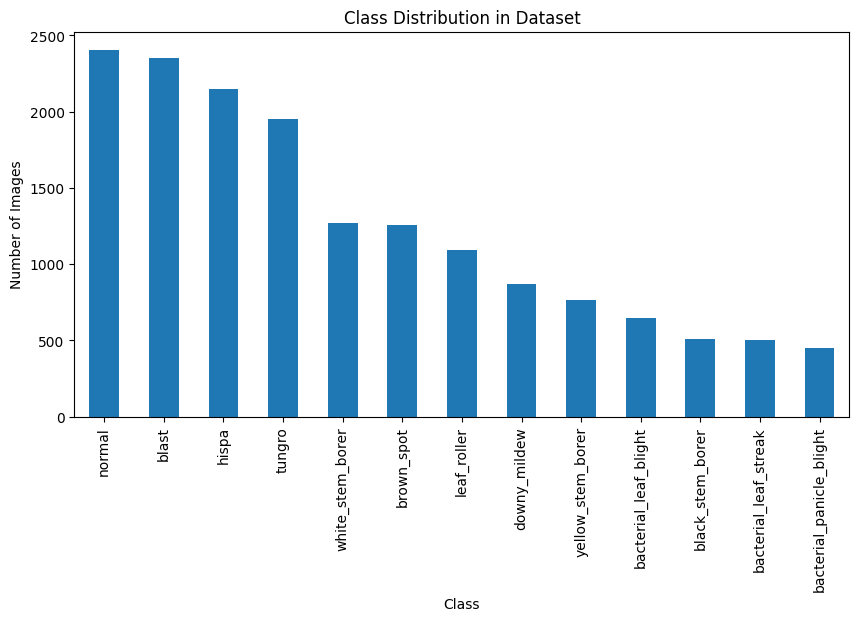

In [ ]:
import os
import pandas as pd
import matplotlib.pyplot as plt

# Define paths to the metadata file and image directory
metadata_file_path = os.path.join("/", 'kaggle', 'input','paddydoctor-small', 'metadata.csv')
image_directory = os.path.join("/", 'kaggle', 'input', 'paddydoctor', 'paddydoctor-small-all')

# Load metadata
metadata = pd.read_csv(metadata_file_path)

# Check the structure of metadata file
print(metadata.head())

# Count the number of images per class based on the 'class' column in the metadata
class_distribution = metadata['label'].value_counts()

# Plot class distribution
plt.figure(figsize=(10, 5))
class_distribution.plot(kind='bar')
plt.title('Class Distribution in Dataset')
plt.xlabel('Class')
plt.ylabel('Number of Images')
plt.xticks(rotation=90)
plt.show()

We can see class imbalance here. The model may become biased toward the classes with more data, learning to predict those classes more accurately while struggling with the other classes. This can lead to poor performance on the minority classes. Therefore, standard metrics like accuracy may not reflect the model's true performance.A model could achieve high accuracy by simply predicting the majority classes most of the time, ignoring the minority classes.

### To check if images have consistent shapes or need resizing:

In [ ]:
class_names = metadata['label'].unique()

In [ ]:
class_names

array(['bacterial_leaf_blight', 'bacterial_leaf_streak',
       'bacterial_panicle_blight', 'black_stem_borer', 'blast',
       'brown_spot', 'downy_mildew', 'hispa', 'leaf_roller', 'normal',
       'tungro', 'white_stem_borer', 'yellow_stem_borer'], dtype=object)

In [ ]:
import os
from PIL import Image
import pandas as pd



# Load metadata
metadata = pd.read_csv(metadata_file_path)

# Get unique classes
class_names = metadata['label'].unique()

# List to store image shapes
image_shapes = []

# Loop through each class and get the shape of one sample image
for class_name in class_names:
    # Get a sample image filename for the class
    sample_filename = metadata[metadata['label'] == class_name]['image_id'].iloc[0]
    # Open the image and get its size
    image_path = os.path.join(image_directory, sample_filename)
    with Image.open(image_path) as img:
        image_shapes.append(img.size)

# Print the size of one sample image from each class
print("Sample image shapes:", image_shapes)

Sample image shapes: [(256, 256), (256, 256), (256, 256), (256, 256), (256, 256), (256, 256), (256, 256), (256, 256), (256, 256), (256, 256), (256, 256), (256, 256), (256, 256)]


### Displaying Example Images

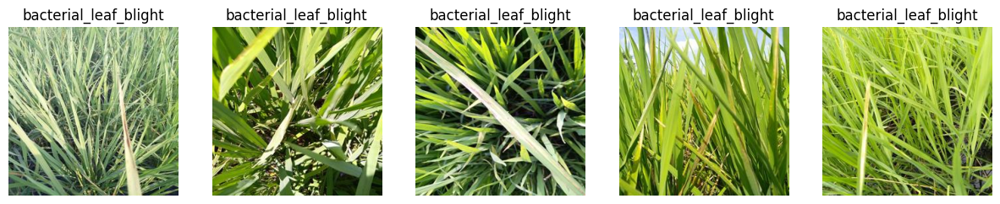

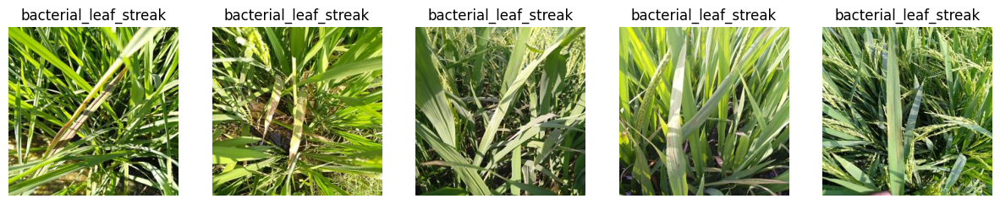

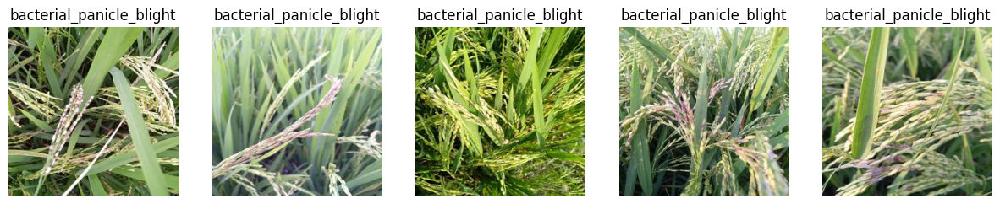

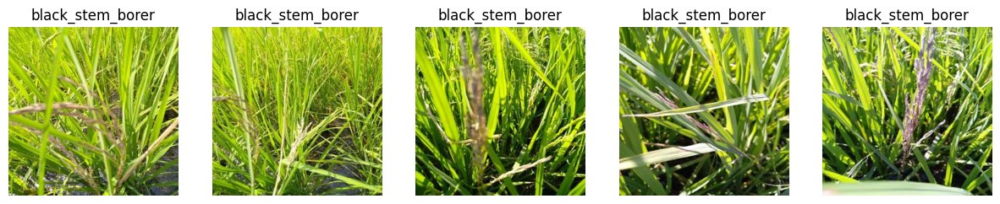

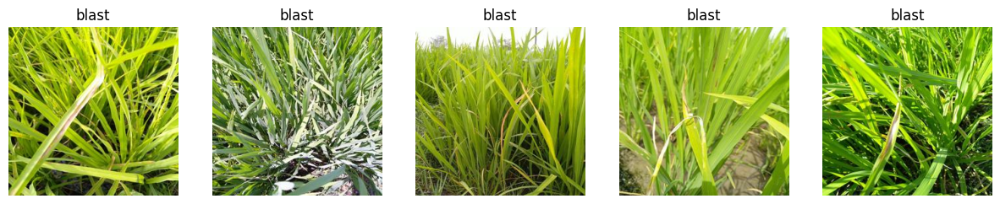

...

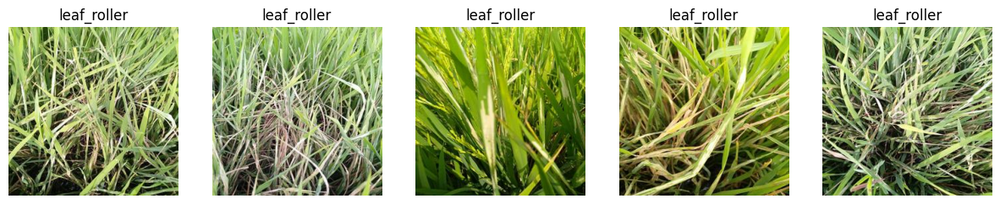

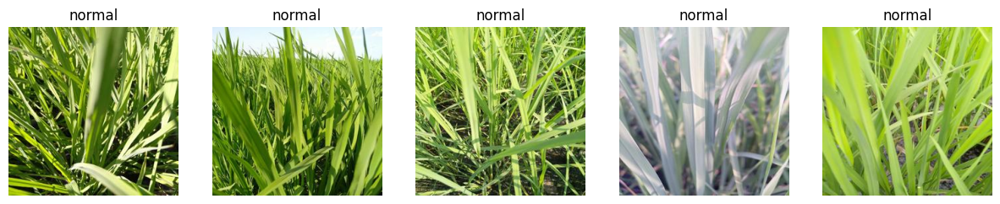

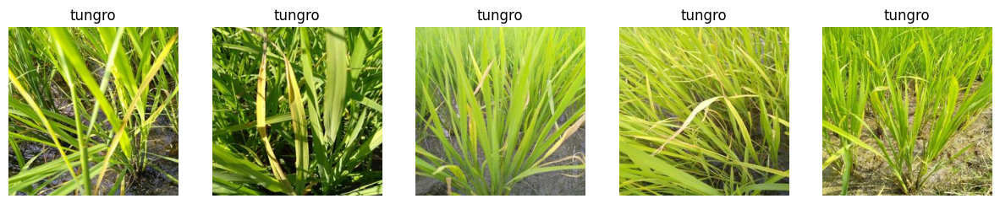

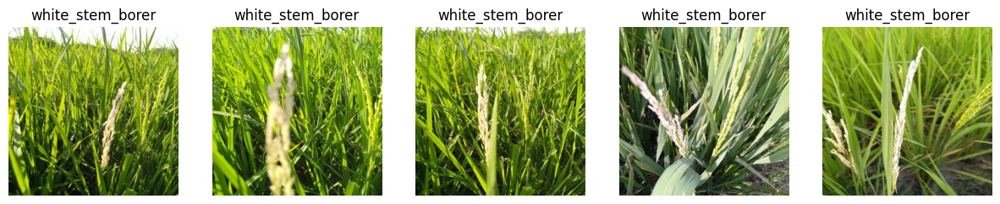

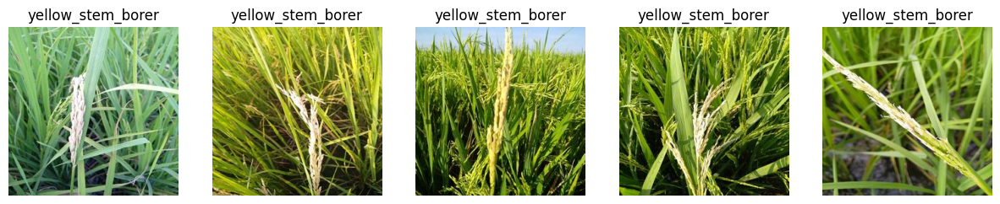

In [ ]:
import os
from PIL import Image
import pandas as pd
import matplotlib.pyplot as plt



# Load metadata
metadata = pd.read_csv(metadata_file_path)

# Function to show 'num_images' images for a given class 'class_name'
def show_images(class_name, num_images=5):
    # Filter metadata for the specified class
    class_images = metadata[metadata['label'] == class_name]['image_id'].head(num_images)

    # Set up the plot with subplots
    fig, axes = plt.subplots(1, num_images, figsize=(15, 5))

    for i, filename in enumerate(class_images):
        image_path = os.path.join(image_directory, filename)
        image = Image.open(image_path)
        axes[i].imshow(image)
        axes[i].axis('off')
        axes[i].set_title(class_name)

    plt.show()

# Observing 5 example images for each class
class_names = metadata['label'].unique()
for class_name in class_names:
    show_images(class_name, num_images=5)

### Image Color Channels Analysis
For color images, it’s useful to analyze the color distribution of each RGB channel to understand if any channel dominates.
This gives an idea of the color balance across images, and whether additional normalization of the RGB channels is necessary.

In [ ]:
import os
import pandas as pd
from sklearn.model_selection import train_test_split
from torchvision import datasets, transforms
from torch.utils.data import DataLoader, Dataset
from PIL import Image
import numpy as np
import torch
# Creating a dataset class for the purpose of finding out image channel distribution
# Load metadata
metadata_file_path = os.path.join("/", 'kaggle', 'input','paddydoctor-small', 'metadata.csv')
image_directory = os.path.join("/", 'kaggle', 'input', 'paddydoctor', 'paddydoctor-small-all')


metadata = pd.read_csv(metadata_file_path)

# Split metadata into train and test sets
train_metadata, test_metadata = train_test_split(metadata, test_size=0.2, stratify=metadata['label'], random_state=42)

In [ ]:
class PaddyDataset(Dataset):
    def __init__(self, metadata, image_directory, transform=None):
        self.metadata = metadata
        self.image_directory = image_directory
        self.transform = transform

    def __len__(self):
        return len(self.metadata)

    def __getitem__(self, idx):
        img_name = os.path.join(self.image_directory, self.metadata.iloc[idx, 0])
        image = Image.open(img_name).convert('RGB')
        if self.transform:
            image = self.transform(image)
        return image

In [ ]:
from tqdm import tqdm

def calculate_normalization(loader):
    mean = 0.
    std = 0.
    total_images_count = 0
    for images in tqdm(loader, desc="Calculating normalization values"):
        images = images.to('cuda')  # Move to GPU
        batch_samples = images.size(0)  # Batch size (the last batch can have smaller size)
        images = images.view(batch_samples, images.size(1), -1)  # Flatten the image
        mean += images.mean(2).sum(0)
        std += images.std(2).sum(0)
        total_images_count += batch_samples

    mean /= total_images_count
    std /= total_images_count
    return mean, std

# Define transformations (only resizing here, normalize later)
transform = transforms.Compose([transforms.Resize((224, 224)), transforms.ToTensor()])

# Create data loaders for train and test sets
train_dataset = PaddyDataset(train_metadata, image_directory, transform=transform)
test_dataset = PaddyDataset(test_metadata, image_directory, transform=transform)

train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True, num_workers=2)
test_loader = DataLoader(test_dataset, batch_size=64, shuffle=True, num_workers=2)

# Calculate normalization values with progress bars
train_mean, train_std = calculate_normalization(train_loader)
test_mean, test_std = calculate_normalization(test_loader)

# Print normalization values
print("Train Mean:", train_mean.cpu().numpy())
print("Train Std:", train_std.cpu().numpy())
print("Test Mean:", test_mean.cpu().numpy())
print("Test Std:", test_std.cpu().numpy())

Calculating normalization values: 100%|██████████| 51/51 [00:11<00:00,  4.38it/s]


Train Mean: [0.49794492 0.5862968  0.23901094]
Train Std: [0.21254903 0.21438895 0.17312424]
Test Mean: [0.49789983 0.58628714 0.23969617]
Test Std: [0.21243614 0.2140995  0.17237587]


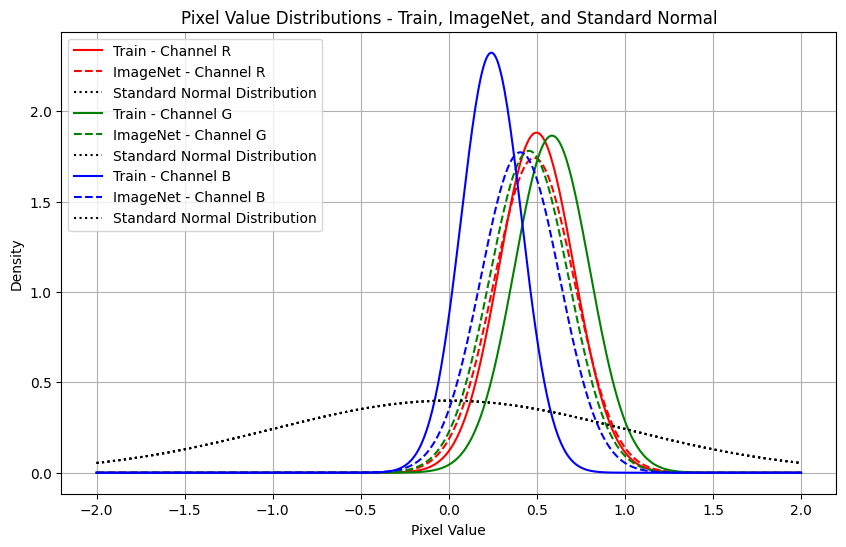

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import norm

# Mean and standard deviation values
train_mean = [0.49778438, 0.5858855, 0.24174799]
train_std = [0.21198662, 0.21387792, 0.17163953]
imagenet_mean = [0.485, 0.456, 0.406]  # ImageNet mean
imagenet_std = [0.229, 0.224, 0.225]   # ImageNet std

# Colors for RGB channels
colors = ['r', 'g', 'b']
x = np.linspace(-2, 2, 500)  # Define range of x for the plot

plt.figure(figsize=(10, 6))

# Plot Gaussian distributions for each channel
for i, color in enumerate(colors):
    # Train distribution
    train_dist = norm.pdf(x, train_mean[i], train_std[i])
    plt.plot(x, train_dist, color=color, linestyle='-', label=f'Train - Channel {color.upper()}')

    # ImageNet distribution
    imagenet_dist = norm.pdf(x, imagenet_mean[i], imagenet_std[i])
    plt.plot(x, imagenet_dist, color=color, linestyle='--', label=f'ImageNet - Channel {color.upper()}')

    # Standard normal distribution (mean 0, std 1)
    standard_normal_dist = norm.pdf(x, 0, 1)
    plt.plot(x, standard_normal_dist, color='k', linestyle=':', label='Standard Normal Distribution')

# Customize plot
plt.xlabel("Pixel Value")
plt.ylabel("Density")
plt.title("Pixel Value Distributions - Train, ImageNet, and Standard Normal")
plt.legend()
plt.grid(True)
plt.show()

Based upon this plot, we conclude that it is better to use dataset's own normalization than ImageNet normalization as the divergence for B channel distribution is large for Imagenet and our dataset

# 2. Data PreProcessing
In order to ensure efficient training and make sure that inputs match the required dimensions of the model, we need to process image before input. We will also prepare dataloaders in this step

In [ ]:
class PaddyDiseaseDataset(Dataset):
    def __init__(self, metadata_file_path, image_directory, transform=None):
        self.metadata = pd.read_csv(metadata_file_path)
        self.image_directory = image_directory
        self.transform = transform

        # Extract unique labels from the metadata
        self.labels = self.metadata.iloc[:, 1].unique()  # Assuming the second column contains the labels
        self.label_encoder = LabelEncoder()
        self.label_encoder.fit(self.labels)  # Fit the label encoder on unique labels

    def __len__(self):
        return len(self.metadata)

    def __getitem__(self, idx):
        img_name = os.path.join(self.image_directory, self.metadata.iloc[idx, 0])
        image = cv2.imread(img_name)
        label = self.metadata.iloc[idx, 1]
        label = self.label_encoder.transform([label])[0]  # Transform using LabelEncoder

        # Convert label to a numeric class index if necessary
        label = label

        if self.transform:
            image = self.transform(image)

        return image, label

In [ ]:
from torchvision import transforms

# Composing transforms for training and testing datasets
data_transforms = {
    'train': transforms.Compose([
        transforms.CenterCrop(224),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),  # Ensures channel-first format
        transforms.Normalize(
            train_mean,  # Use the computed train mean values
            train_std    # Use the computed train std values
        )
    ]),
    'test': transforms.Compose([
        transforms.Resize(224),
        transforms.CenterCrop(224),
        transforms.ToTensor(),  # Ensures channel-first format
        transforms.Normalize(
            test_mean,   # Use the computed test mean values
            test_std     # Use the computed test std values
        )
    ]),
}

In [ ]:

# Create dataset instance with transforms
dataset = PaddyDiseaseDataset(
    metadata_file_path,
    image_directory
)

In [ ]:
# Assuming 'dataset' is your dataset object
train_size = int(0.7 * len(dataset))  # 70% for training
val_size = int(0.15 * len(dataset))   # 15% for validation
test_size = len(dataset) - train_size - val_size  # Remaining 15% for testing
train_dataset, val_dataset, test_dataset = random_split(dataset, [train_size, val_size, test_size])

# Create DataLoaders for training, validation, and testing
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

In [ ]:
label_name_mapping = dict(zip(dataset.label_encoder.transform(dataset.label_encoder.classes_),dataset.label_encoder.classes_))
label_name_mapping

{0: 'bacterial_leaf_blight',
 1: 'bacterial_leaf_streak',
 2: 'bacterial_panicle_blight',
 3: 'black_stem_borer',
 4: 'blast',
 5: 'brown_spot',
 6: 'downy_mildew',
 7: 'hispa',
 8: 'leaf_roller',
 9: 'normal',
 10: 'tungro',
 11: 'white_stem_borer',
 12: 'yellow_stem_borer'}

### Testing Dataloader

In [ ]:
for images, labels in train_loader:
    print(images.shape)  # Should print the shape of the batch of images
    print(labels)        # Should print the batch of labels
    break  # Remove this break to iterate over the entire DataLoader

torch.Size([32, 256, 256, 3])
tensor([ 7, 10,  2,  4,  2,  9, 10,  0, 11,  7,  7,  0,  7, 10,  6, 10,  9, 10,
         7,  5,  7,  7,  9,  3, 11,  7, 11, 10, 12,  6,  7, 12])


### Checking results

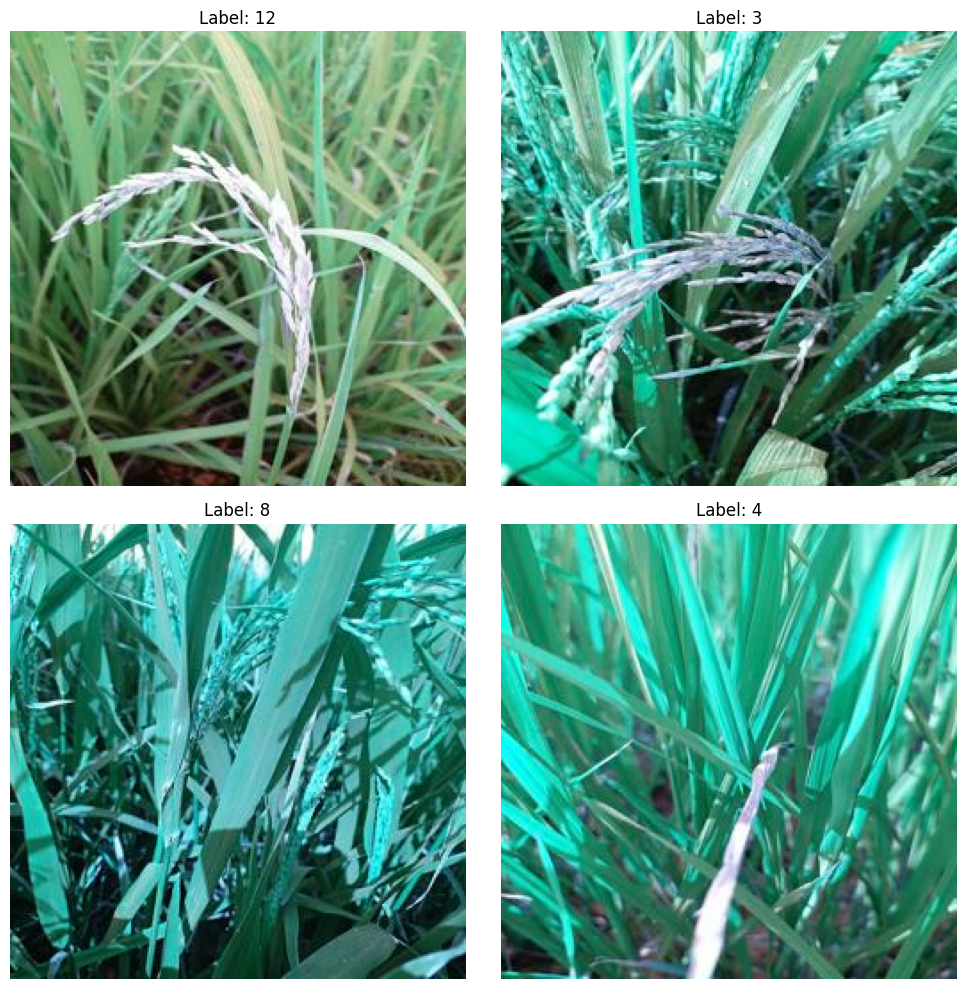

In [ ]:
import torch
import matplotlib.pyplot as plt

def show_sample_images(data_loader, num_images=8):
    # Get a batch of images and labels
    images, labels = next(iter(data_loader))

    # Check the actual number of images in the batch
    num_available_images = min(num_images, images.size(0))

    # Select only the available number of images to display
    images_to_show = images[:num_available_images]
    labels_to_show = labels[:num_available_images]

    # Set up the plot
    grid_size = int(num_available_images ** 0.5) + (num_available_images % 2)  # Adjust grid size
    fig, axes = plt.subplots(grid_size, grid_size, figsize=(10, 10))
    axes = axes.flatten()

    for i in range(num_available_images):
        ax = axes[i]
        # Convert image to numpy array and ensure it's in the range [0, 1]
        img = images_to_show[i].cpu().numpy()
        img = img / 255.0  # Normalize to [0, 1] for display if necessary
        ax.imshow(img)  # Display the image
        ax.set_title(f'Label: {labels_to_show[i].item()}')  # Display the label
        ax.axis('off')  # Turn off axis

    # Hide any unused axes if the number of images is less than the grid size
    for j in range(num_available_images, grid_size * grid_size):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()

# Call this function after defining your DataLoader
show_sample_images(train_loader, num_images=4)

# 3. Model Architecture

## ResNet-18
![ResNet-18 Architecture](https://pub.mdpi-res.com/applsci/applsci-13-00240/article_deploy/html/images/applsci-13-00240-g005.png?1672839236)

**Reference:** Brown, Jason & Gharineiat, Zahra & Raj, Nawin. (2022). CNN Based Image Classification of Malicious UAVs. *Applied Sciences*, 13, 240. https://doi.org/10.3390/app13010240.

ResNet-18 (Residual Network) is a convolutional neural network architecture that was introduced by Kaiming He et al. in 2015. It is a variant of the ResNet family that features 18 layers and is widely known for its innovative use of skip connections or residual connections. This architecture significantly changed the landscape of deep learning for computer vision by allowing for the training of much deeper networks without encountering the vanishing gradient problem.

# 4. Model Training

In [ ]:
import torch
import torchvision.models as models
import torch.optim as optim
import torch.nn.functional as F

In [ ]:
# Define device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

device

device(type='cuda')

In [ ]:


# Load the pre-trained ResNet-18 model
model_18 = models.resnet18(weights='IMAGENET1K_V1')  # Use the pre-trained weights

# Get the number of classes from dataset
num_classes = len(dataset.labels)

# Modify the final fully connected layer to match the number of classes
model_18.fc = torch.nn.Linear(model_18.fc.in_features, num_classes)
model_18 = model_18.to(device)  # Move model to the device (CPU or GPU)

# Define loss function and optimizer for ResNet-18
criterion_18 = torch.nn.CrossEntropyLoss()
optimizer_18 = optim.Adam(model_18.parameters(), lr=0.001)


In [ ]:
# Load the pre-trained ResNet-50 model
model_50 = models.resnet50(weights='IMAGENET1K_V1')  # Use the pre-trained weights

# Modify the final fully connected layer to match the number of classes
model_50.fc = torch.nn.Linear(model_50.fc.in_features, num_classes)
model_50 = model_50.to(device)  # Move model to the device (CPU or GPU)

# Define loss function and optimizer for ResNet-50
criterion_50 = torch.nn.CrossEntropyLoss()
optimizer_50 = optim.Adam(model_50.parameters(), lr=0.001)

In [ ]:
import wandb
from tqdm import tqdm
import torch
import seaborn as sns
import matplotlib.pyplot as plt

# Training function with tqdm progress bar and wandb logging
def train_model(model, train_loader, val_loader, criterion, optimizer, num_epochs=10):
    for epoch in range(num_epochs):
        # Training phase
        model.train()
        train_loss = 0.0
        correct_train = 0
        total_train = 0

        for images, labels in tqdm(train_loader, desc=f'Epoch [{epoch+1}/{num_epochs}] - Training'):
            images, labels = images.to(device), labels.to(device)

            # Rearrange the dimensions from [batch_size, height, width, channels]
            # to [batch_size, channels, height, width]
            images = images.permute(0, 3, 1, 2)  # Change from [32, 256, 256, 3] to [32, 3, 256, 256]

            # Convert to float
            images = images.float() / 255.0  # Normalize to [0, 1] if images are in [0, 255] range

            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            train_loss += loss.item()
            _, predicted = torch.max(outputs, 1)
            total_train += labels.size(0)
            correct_train += (predicted == labels).sum().item()

        train_accuracy = 100 * correct_train / total_train
        avg_train_loss = train_loss / len(train_loader)

        # Validation phase
        model.eval()
        val_loss = 0.0
        correct_val = 0
        total_val = 0

        with torch.no_grad():
            for images, labels in tqdm(val_loader, desc=f'Epoch [{epoch+1}/{num_epochs}] - Validation'):
                images, labels = images.to(device), labels.to(device)

                # Ensure validation images are also permuted correctly
                images = images.permute(0, 3, 1, 2)  # Change from [batch_size, height, width, channels]
                images = images.float() / 255.0
                outputs = model(images)
                loss = criterion(outputs, labels)

                val_loss += loss.item()
                _, predicted = torch.max(outputs, 1)
                total_val += labels.size(0)
                correct_val += (predicted == labels).sum().item()

        val_accuracy = 100 * correct_val / total_val
        avg_val_loss = val_loss / len(val_loader)

        # Log metrics to wandb
        wandb.log({
            "epoch": epoch + 1,
            "train_loss": avg_train_loss,
            "train_accuracy": train_accuracy,
            "val_loss": avg_val_loss,
            "val_accuracy": val_accuracy
        })

        # Print epoch results
        print(f'Epoch [{epoch+1}/{num_epochs}], Train Loss: {avg_train_loss:.4f}, Train Accuracy: {train_accuracy:.2f}%, '
              f'Val Loss: {avg_val_loss:.4f}, Val Accuracy: {val_accuracy:.2f}%')

import numpy as np
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score, balanced_accuracy_score

def test_model(model, test_loader, class_names):
    model.eval()
    all_labels = []
    all_predictions = []

    with torch.no_grad():
        for images, labels in tqdm(test_loader, desc="Testing"):
            images, labels = images.to(device), labels.to(device)
            images = images.permute(0, 3, 1, 2)  # Change from [batch_size, height, width, channels]
            images = images.float() / 255.0
            outputs = model(images)
            _, predicted = torch.max(outputs, 1)

            # Store the true labels and predictions
            all_labels.extend(labels.cpu().numpy())      # Collect true labels
            all_predictions.extend(predicted.cpu().numpy())  # Collect predicted labels

    # Convert lists to numpy arrays for metric calculation
    all_labels = np.array(all_labels)
    all_predictions = np.array(all_predictions)

    # Calculate metrics
    test_accuracy = accuracy_score(all_labels, all_predictions) * 100
    balanced_acc = balanced_accuracy_score(all_labels, all_predictions) * 100
    precision = precision_score(all_labels, all_predictions, average='weighted', zero_division=0)
    recall = recall_score(all_labels, all_predictions, average='weighted', zero_division=0)
    f1 = f1_score(all_labels, all_predictions, average='weighted', zero_division=0)
    cm = confusion_matrix(all_labels, all_predictions)

    # Plot confusion matrix
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.title('Confusion Matrix')
    plt.show()

    # Log metrics to wandb
    wandb.log({
        "test_accuracy": test_accuracy,
        "balanced_accuracy": balanced_acc,
        "precision": precision,
        "recall": recall,
        "f1_score": f1,
    })

    # Print metrics
    print(f'Accuracy of the model on the test images: {test_accuracy:.2f}%')
    print(f'Balanced Accuracy: {balanced_acc:.2f}%')
    print(f'Precision: {precision:.2f}')
    print(f'Recall: {recall:.2f}')
    print(f'F1 Score: {f1:.2f}')
    print('Confusion Matrix:')
    print(cm)


### Train Resnet 18

In [ ]:

# Train the model
num_epochs = 10
train_model(model_18, train_loader, val_loader, criterion_18, optimizer_18, num_epochs)

# Save the model
torch.save(model_18.state_dict(), 'resnet18.pth')

Epoch [1/10] - Validation: 100%|██████████| 77/77 [00:06<00:00, 12.18it/s]


Epoch [1/10], Train Loss: 1.0964, Train Accuracy: 65.08%, Val Loss: 1.2275, Val Accuracy: 61.49%


Epoch [2/10] - Validation: 100%|██████████| 77/77 [00:07<00:00, 10.77it/s]


Epoch [2/10], Train Loss: 0.4738, Train Accuracy: 84.93%, Val Loss: 0.4909, Val Accuracy: 85.66%


Epoch [3/10] - Validation: 100%|██████████| 77/77 [00:06<00:00, 12.28it/s]


Epoch [3/10], Train Loss: 0.2887, Train Accuracy: 90.96%, Val Loss: 0.5047, Val Accuracy: 84.59%


Epoch [4/10] - Validation: 100%|██████████| 77/77 [00:06<00:00, 12.27it/s]


Epoch [4/10], Train Loss: 0.2001, Train Accuracy: 93.73%, Val Loss: 0.4292, Val Accuracy: 87.96%


Epoch [5/10] - Validation: 100%|██████████| 77/77 [00:06<00:00, 12.34it/s]


Epoch [5/10], Train Loss: 0.1386, Train Accuracy: 95.41%, Val Loss: 0.6351, Val Accuracy: 83.03%


Epoch [6/10] - Validation: 100%|██████████| 77/77 [00:06<00:00, 12.18it/s]


Epoch [6/10], Train Loss: 0.1248, Train Accuracy: 96.02%, Val Loss: 0.4489, Val Accuracy: 89.56%


Epoch [7/10] - Validation: 100%|██████████| 77/77 [00:06<00:00, 12.37it/s]


Epoch [7/10], Train Loss: 0.0978, Train Accuracy: 96.99%, Val Loss: 0.3454, Val Accuracy: 91.20%


Epoch [8/10] - Validation: 100%|██████████| 77/77 [00:06<00:00, 11.99it/s]


Epoch [8/10], Train Loss: 0.1098, Train Accuracy: 96.34%, Val Loss: 0.8576, Val Accuracy: 79.49%


Epoch [9/10] - Validation: 100%|██████████| 77/77 [00:06<00:00, 11.56it/s]


Epoch [9/10], Train Loss: 0.1009, Train Accuracy: 96.86%, Val Loss: 0.4255, Val Accuracy: 89.15%


Epoch [10/10] - Validation: 100%|██████████| 77/77 [00:06<00:00, 12.38it/s]


Epoch [10/10], Train Loss: 0.0611, Train Accuracy: 98.11%, Val Loss: 0.8664, Val Accuracy: 81.46%


### Train Resnet 50

In [ ]:
num_epochs = 10
# Train ResNet-50
train_model(model_50, train_loader, val_loader, criterion_50, optimizer_50, num_epochs)
# Save the model
torch.save(model_50.state_dict(), 'resnet50.pth')

Epoch [1/10] - Training: 100%|██████████| 355/355 [08:53<00:00,  1.50s/it]Epoch [1/10] - Validation: 100%|██████████| 77/77 [00:12<00:00,  6.03it/s]

Epoch [1/10], Train Loss: 1.5777, Train Accuracy: 48.06%, Val Loss: 1.2674, Val Accuracy: 58.65%

Epoch [2/10] - Training: 100%|██████████| 355/355 [08:56<00:00,  1.51s/it]Epoch [2/10] - Validation: 100%|██████████| 77/77 [00:13<00:00,  5.64it/s]

Epoch [2/10], Train Loss: 1.0311, Train Accuracy: 65.99%, Val Loss: 0.9350, Val Accuracy: 70.78%

Epoch [3/10] - Training: 100%|██████████| 355/355 [08:57<00:00,  1.51s/it]Epoch [3/10] - Validation: 100%|██████████| 77/77 [00:13<00:00,  5.87it/s]

Epoch [3/10], Train Loss: 0.7774, Train Accuracy: 74.75%, Val Loss: 0.7781, Val Accuracy: 75.71%

Epoch [4/10] - Training: 100%|██████████| 355/355 [08:56<00:00,  1.51s/it]Epoch [4/10] - Validation: 100%|██████████| 77/77 [00:12<00:00,  6.09it/s]

Epoch [4/10], Train Loss: 0.5742, Train Accuracy: 81.30%, Val Loss: 0.5907, Val Accuracy: 81.87%

Epoch [5/10] - Training: 100%|██████████| 355/355 [08:55<00:00,  1.51s/it]Epoch [5/10] - Validation: 100%|██████████| 77/77 [00:12<00:00,  6.31it/s]

Epoch [5/10], Train Loss: 0.4350, Train Accuracy: 85.40%, Val Loss: 0.7309, Val Accuracy: 78.22%

Epoch [6/10] - Training: 100%|██████████| 355/355 [08:57<00:00,  1.51s/it]Epoch [6/10] - Validation: 100%|██████████| 77/77 [00:14<00:00,  5.48it/s]

Epoch [6/10], Train Loss: 0.3399, Train Accuracy: 88.91%, Val Loss: 0.9003, Val Accuracy: 74.19%

Epoch [7/10] - Training: 100%|██████████| 355/355 [08:57<00:00,  1.51s/it]Epoch [7/10] - Validation: 100%|██████████| 77/77 [00:13<00:00,  5.63it/s]

Epoch [7/10], Train Loss: 0.2770, Train Accuracy: 90.83%, Val Loss: 0.4779, Val Accuracy: 86.44%

Epoch [8/10] - Training: 100%|██████████| 355/355 [09:01<00:00,  1.52s/it]Epoch [8/10] - Validation: 100%|██████████| 77/77 [00:14<00:00,  5.31it/s]

Epoch [8/10], Train Loss: 0.1970, Train Accuracy: 93.43%, Val Loss: 0.7536, Val Accuracy: 78.22%

Epoch [9/10] - Training: 100%|██████████| 355/355 [09:00<00:00,  1.52s/it]Epoch [9/10] - Validation: 100%|██████████| 77/77 [00:13<00:00,  5.73it/s]

Epoch [9/10], Train Loss: 0.1883, Train Accuracy: 93.78%, Val Loss: 0.6824, Val Accuracy: 80.56%

Epoch [10/10] - Training: 100%|██████████| 355/355 [08:59<00:00,  1.52s/it]Epoch [10/10] - Validation: 100%|██████████| 77/77 [00:13<00:00,  5.67it/s]

Epoch [10/10], Train Loss: 0.1280, Train Accuracy: 95.73%, Val Loss: 0.8678, Val Accuracy: 78.63%

# 5. Evaluation

In [ ]:
class_names = [
    'bacterial_leaf_blight',   # 0
    'bacterial_leaf_streak',   # 1
    'bacterial_panicle_blight', # 2
    'black_stem_borer',         # 3
    'blast',                    # 4
    'brown_spot',               # 5
    'downy_mildew',             # 6
    'hispa',                    # 7
    'leaf_roller',              # 8
    'normal',                   # 9
    'tungro',                   # 10
    'white_stem_borer',         # 11
    'yellow_stem_borer'         # 12
]


### Test Resnet 18

Testing: 100%|██████████| 77/77 [00:09<00:00,  7.83it/s]


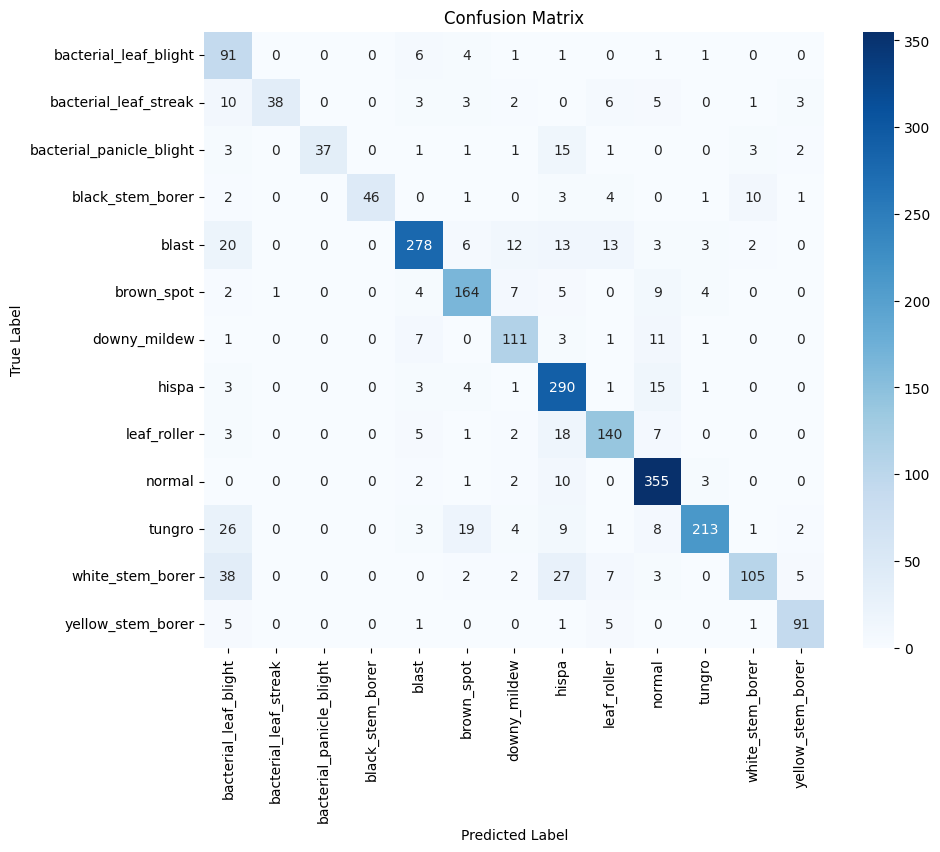

Accuracy of the model on the test images: 80.45%
Balanced Accuracy: 76.49%
Precision: 0.83
Recall: 0.80
F1 Score: 0.81
Confusion Matrix:
[[ 91   0   0   0   6   4   1   1   0   1   1   0   0]
 [ 10  38   0   0   3   3   2   0   6   5   0   1   3]
 [  3   0  37   0   1   1   1  15   1   0   0   3   2]
 [  2   0   0  46   0   1   0   3   4   0   1  10   1]
 [ 20   0   0   0 278   6  12  13  13   3   3   2   0]
 [  2   1   0   0   4 164   7   5   0   9   4   0   0]
 [  1   0   0   0   7   0 111   3   1  11   1   0   0]
 [  3   0   0   0   3   4   1 290   1  15   1   0   0]
 [  3   0   0   0   5   1   2  18 140   7   0   0   0]
 [  0   0   0   0   2   1   2  10   0 355   3   0   0]
 [ 26   0   0   0   3  19   4   9   1   8 213   1   2]
 [ 38   0   0   0   0   2   2  27   7   3   0 105   5]
 [  5   0   0   0   1   0   0   1   5   0   0   1  91]]


In [ ]:
test_model(model_18, test_loader,class_names)

### Test Resnet 50

Testing: 100%|██████████| 77/77 [00:12<00:00,  6.08it/s]

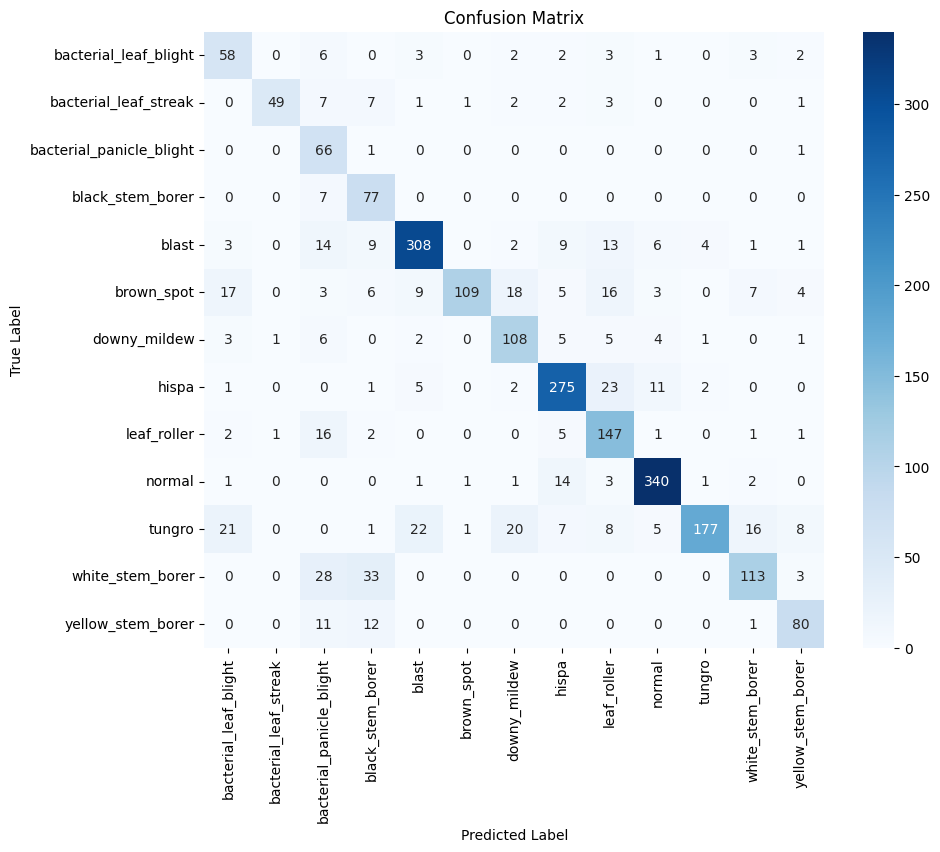

Accuracy of the model on the test images: 78.32%Balanced Accuracy: 77.83%Precision: 0.83Recall: 0.78F1 Score: 0.79Confusion Matrix:[[ 58   0   6   0   3   0   2   2   3   1   0   3   2] [  0  49   7   7   1   1   2   2   3   0   0   0   1] [  0   0  66   1   0   0   0   0   0   0   0   0   1] [  0   0   7  77   0   0   0   0   0   0   0   0   0] [  3   0  14   9 308   0   2   9  13   6   4   1   1] [ 17   0   3   6   9 109  18   5  16   3   0   7   4] [  3   1   6   0   2   0 108   5   5   4   1   0   1] [  1   0   0   1   5   0   2 275  23  11   2   0   0] [  2   1  16   2   0   0   0   5 147   1   0   1   1] [  1   0   0   0   1   1   1  14   3 340   1   2   0] [ 21   0   0   1  22   1  20   7   8   5 177  16   8] [  0   0  28  33   0   0   0   0   0   0   0 113   3] [  0   0  11  12   0   0   0   0   0   0   0   1  80]]

In [ ]:
test_model(model_50, test_loader,class_names)

# kfold

In [ ]:
import torch
import torch.optim as optim
from torchvision import models
from torch.utils.data import DataLoader, Dataset, Subset
from sklearn.model_selection import KFold
import wandb
from tqdm import tqdm  # Import tqdm

# Initialize wandb
wandb.init(project="resnet18_cv")

# Set device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Define hyperparameters
num_epochs = 10
batch_size = 32
num_classes = len(dataset.labels)  # Assuming your dataset has a 'labels' attribute

# Load the pre-trained ResNet18 model
model = models.resnet18(weights='IMAGENET1K_V1')

# Modify the final fully connected layer to match the number of classes
model.fc = torch.nn.Linear(model.fc.in_features, num_classes)
model = model.to(device)  # Move model to the device (CPU or GPU)

# Define loss function and optimizer
criterion = torch.nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

# 3-Fold Cross-Validation
kf = KFold(n_splits=3, shuffle=True, random_state=42)

for fold, (train_indices, val_indices) in enumerate(kf.split(range(len(dataset)))):

    # Load the pre-trained ResNet18 model
    model = models.resnet18(weights='IMAGENET1K_V1')

    # Modify the final fully connected layer to match the number of classes
    model.fc = torch.nn.Linear(model.fc.in_features, num_classes)
    model = model.to(device)  # Move model to the device (CPU or GPU)

    # Define loss function and optimizer
    criterion = torch.nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=0.001)

    print(f"Fold {fold + 1}/{kf.n_splits}")

    # Create training and validation datasets
    train_subset = Subset(dataset, train_indices)
    val_subset = Subset(dataset, val_indices)

    # Create DataLoaders for training and validation
    train_loader = DataLoader(train_subset, batch_size=batch_size, shuffle=True)
    val_loader = DataLoader(val_subset, batch_size=batch_size, shuffle=False)

    # Training loop for the current fold
    for epoch in range(num_epochs):
        model.train()
        train_loss = 0.0
        correct_train = 0
        total_train = 0

        # Wrap the training loop with tqdm
        for images, labels in tqdm(train_loader, desc=f'Training Epoch {epoch + 1}/{num_epochs}', unit='batch'):
            images, labels = images.to(device), labels.to(device)

            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            train_loss += loss.item()
            _, predicted = torch.max(outputs, 1)
            total_train += labels.size(0)
            correct_train += (predicted == labels).sum().item()

        train_accuracy = 100 * correct_train / total_train
        avg_train_loss = train_loss / len(train_loader)

        # Validation phase
        model.eval()
        val_loss = 0.0
        correct_val = 0
        total_val = 0

        # Wrap the validation loop with tqdm
        with torch.no_grad():
            for images, labels in tqdm(val_loader, desc=f'Validating Epoch {epoch + 1}/{num_epochs}', unit='batch'):
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                loss = criterion(outputs, labels)

                val_loss += loss.item()
                _, predicted = torch.max(outputs, 1)
                total_val += labels.size(0)
                correct_val += (predicted == labels).sum().item()

        val_accuracy = 100 * correct_val / total_val
        avg_val_loss = val_loss / len(val_loader)

        # Log metrics to wandb
        wandb.log({
            "fold": fold + 1,
            "epoch": epoch + 1,
            "train_loss": avg_train_loss,
            "train_accuracy": train_accuracy,
            "val_loss": avg_val_loss,
            "val_accuracy": val_accuracy
        })

        print(f'Epoch [{epoch + 1}/{num_epochs}], '
              f'Train Loss: {avg_train_loss:.4f}, Train Accuracy: {train_accuracy:.2f}%, '
              f'Val Loss: {avg_val_loss:.4f}, Val Accuracy: {val_accuracy:.2f}%')

# Finish wandb run
wandb.finish()

# 6. Result Analysis

# 7. Conclusion

# 8. Recommendations for Future Improvements

For anyone addressing this problem in the future, the following strategies are suggested to enhance the model's performance:

- **Data Augmentation:**
- **Regularization Techniques:**

# 9. References

# Mobile net
To be discussed ...